#                                             CAPSTONE PROJECT

#### This dataset provides real-time weather information for major cities in India. Unlike forecast data, this dataset offers a comprehensive set of features that reflect the current weather conditions.
Starting from August 29, 2023 
It provides over 40+ features, including temperature, wind, pressure, precipitation, humidity, visibility, and air quality measurements. This dataset is a valuable resource for analyzing India's present weather trends and exploring the relationships between various weather parameters.

In [1]:
#pip install folium

In [2]:
%matplotlib inline

import matplotlib.pyplot as plt
import pandas as pd
import numpy as num
import sklearn as sk
import seaborn as sns
import plotly.express as px
from sklearn import linear_model
from sklearn.preprocessing import StandardScaler
scale = StandardScaler()
import folium
from folium.plugins import HeatMap 

In [3]:
df= pd.read_csv("E:/IndianWeatherRepository.csv")


In [4]:
df.head()

,Country,Location_Name,Region,Latitude,Longitude,Timezone,Last_Updated,Temperature_Celsius,Temperature_Fahrenheit,Condition_Text,...,Air_Quality_PM2.5,Air_Quality_PM10,Air_Quality_Us-Epa-Index,Air_Quality_Gb-Defra-Index,Sunrise,Sunset,Moonrise,Moonset,Moon_Phase,Moon_Illumination
0,India,Ashoknagar,Madhya Pradesh,24.57,77.72,Asia/Kolkata,29-08-2023 10:45,27.5,81.5,Partly cloudy,...,12.6,18.5,1,2,5:59 AM,6:41 PM,5:42 PM,3:38 AM,Waxing Gibbous,93
1,India,Raisen,Madhya Pradesh,23.33,77.80,Asia/Kolkata,29-08-2023 10:45,27.5,81.5,Sunny,...,10.7,14.2,1,1,6:00 AM,6:40 PM,5:39 PM,3:41 AM,Waxing Gibbous,93
2,India,Chhindwara,Madhya Pradesh,22.07,78.93,Asia/Kolkata,29-08-2023 10:45,26.3,79.3,Partly cloudy,...,16.8,20.7,2,2,5:56 AM,6:34 PM,5:32 PM,3:39 AM,Waxing Gibbous,93
3,India,Betul,Madhya Pradesh,21.86,77.93,Asia/Kolkata,29-08-2023 10:45,25.6,78.1,Cloudy,...,4.9,6.6,1,1,6:00 AM,6:38 PM,5:36 PM,3:43 AM,Waxing Gibbous,93
4,India,Hoshangabad,Madhya Pradesh,22.75,77.72,Asia/Kolkata,29-08-2023 10:45,27.2,81.0,Cloudy,...,11.4,14.8,1,1,6:01 AM,6:39 PM,5:38 PM,3:42 AM,Waxing Gibbous,93


In [5]:
df.tail()

,Country,Location_Name,Region,Latitude,Longitude,Timezone,Last_Updated,Temperature_Celsius,Temperature_Fahrenheit,Condition_Text,...,Air_Quality_PM2.5,Air_Quality_PM10,Air_Quality_Us-Epa-Index,Air_Quality_Gb-Defra-Index,Sunrise,Sunset,Moonrise,Moonset,Moon_Phase,Moon_Illumination
87103,India,Niwari,Uttar Pradesh,28.88,77.53,Asia/Kolkata,07-02-2024 23:15,12.0,53.6,Mist,...,75.8,95.5,4,10,7:05 AM,6:03 PM,4:53 AM,3:00 PM,Waning Crescent,12
87104,India,Saitual,Mizoram,23.97,92.58,Asia/Kolkata,07-02-2024 23:15,9.8,49.7,Clear,...,56.1,66.4,3,7,5:58 AM,5:10 PM,3:36 AM,2:11 PM,Waning Crescent,12
87105,India,Ranipet,Tamil Nadu,12.93,79.33,Asia/Kolkata,07-02-2024 23:15,20.9,69.6,Clear,...,102.2,120.5,4,10,6:38 AM,6:16 PM,4:03 AM,3:35 PM,Waning Crescent,12
87106,India,Tenkasi,Tamil Nadu,8.97,77.30,Asia/Kolkata,07-02-2024 23:15,28.0,82.4,Mist,...,52.1,66.2,3,6,6:41 AM,6:28 PM,4:02 AM,3:52 PM,Waning Crescent,12
87107,India,Pendra,Maharashtra,21.93,74.15,Asia/Kolkata,07-02-2024 23:15,25.8,78.4,Clear,...,44.4,64.9,3,5,7:10 AM,6:26 PM,4:47 AM,3:34 PM,Waning Crescent,12


In [6]:
df.index

RangeIndex(start=0, stop=87108, step=1)

In [7]:
df.columns

Index(['Country', 'Location_Name', 'Region', 'Latitude', 'Longitude',
       'Timezone', 'Last_Updated', 'Temperature_Celsius',
       'Temperature_Fahrenheit', 'Condition_Text', 'Wind_mph', 'Wind_kph',
       'Wind_Degree', 'Wind_Direction', 'Humidity', 'Cloud',
       'Feels_Like_Celsius', 'Feels_Like_Fahrenheit', 'Visibility_km',
       'Visibility_Miles', 'Uv_Index', 'Air_Quality_Carbon_Monoxide',
       'Air_Quality_Ozone', 'Air_Quality_Nitrogen_Dioxide',
       'Air_Quality_Sulphur_Dioxide', 'Air_Quality_PM2.5', 'Air_Quality_PM10',
       'Air_Quality_Us-Epa-Index', 'Air_Quality_Gb-Defra-Index', 'Sunrise',
       'Sunset', 'Moonrise', 'Moonset', 'Moon_Phase', 'Moon_Illumination'],
      dtype='object')

In [8]:
df.shape

(87108, 35)

#### Shape command used show us "87108" columns, "42" rows are present in the dataset 

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 87108 entries, 0 to 87107
Data columns (total 35 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Country                       87108 non-null  object 
 1   Location_Name                 87108 non-null  object 
 2   Region                        87108 non-null  object 
 3   Latitude                      87108 non-null  float64
 4   Longitude                     87108 non-null  float64
 5   Timezone                      87108 non-null  object 
 6   Last_Updated                  87108 non-null  object 
 7   Temperature_Celsius           87108 non-null  float64
 8   Temperature_Fahrenheit        87108 non-null  float64
 9   Condition_Text                87108 non-null  object 
 10  Wind_mph                      87108 non-null  float64
 11  Wind_kph                      87108 non-null  float64
 12  Wind_Degree                   87108 non-null  int64  
 13  W

#### "info" command shows us "data type" and "non-null count" for each variable in the dataset, in this dataset there are variable with "float64" and "int64" and "object". 

In [10]:
df.describe()

,Latitude,Longitude,Temperature_Celsius,Temperature_Fahrenheit,Wind_mph,Wind_kph,Wind_Degree,Humidity,Cloud,Feels_Like_Celsius,...,Uv_Index,Air_Quality_Carbon_Monoxide,Air_Quality_Ozone,Air_Quality_Nitrogen_Dioxide,Air_Quality_Sulphur_Dioxide,Air_Quality_PM2.5,Air_Quality_PM10,Air_Quality_Us-Epa-Index,Air_Quality_Gb-Defra-Index,Moon_Illumination
count,87108.000000,87108.000000,87108.000000,87108.000000,87108.000000,87108.000000,87108.000000,87108.000000,87108.000000,87108.000000,...,87108.000000,87108.000000,87108.000000,87108.000000,87108.000000,87108.000000,87108.000000,87108.000000,87108.000000,87108.000000
mean,23.097316,80.243005,19.588391,67.259260,4.699157,7.567995,152.044657,67.211680,26.015257,20.431526,...,1.116155,811.959233,35.825814,14.789930,5.842887,101.724954,118.537940,3.379724,6.887645,51.833196
std,5.792509,5.760193,6.141436,11.054386,2.618973,4.206448,114.380624,21.073995,31.192957,7.340706,...,0.822097,676.519742,26.641913,15.367578,12.089887,103.216276,116.062627,1.487496,3.569295,34.829528
min,7.170000,68.970000,-30.500000,-22.800000,2.200000,3.600000,1.000000,10.000000,0.000000,-36.500000,...,1.000000,113.500000,0.000000,0.000000,0.000000,0.500000,0.600000,1.000000,1.000000,0.000000
25%,20.270000,76.070000,16.000000,60.800000,2.500000,4.000000,52.000000,49.000000,2.000000,16.000000,...,1.000000,427.300000,15.000000,5.200000,1.400000,30.300000,38.600000,2.000000,3.000000,18.000000
50%,23.950000,78.690000,20.700000,69.300000,4.000000,6.500000,113.000000,69.000000,10.000000,20.700000,...,1.000000,607.500000,31.100000,10.400000,3.000000,69.400000,84.600000,4.000000,9.000000,52.000000
75%,26.770000,83.900000,24.000000,75.200000,5.800000,9.400000,266.000000,87.000000,49.000000,25.900000,...,1.000000,988.000000,52.200000,19.400000,6.000000,136.200000,157.500000,4.000000,10.000000,86.000000
max,34.570000,95.800000,38.300000,100.900000,26.800000,43.200000,360.000000,100.000000,100.000000,50.500000,...,9.000000,13565.100000,234.600000,274.200000,541.700000,1374.800000,1537.800000,6.000000,10.000000,100.000000


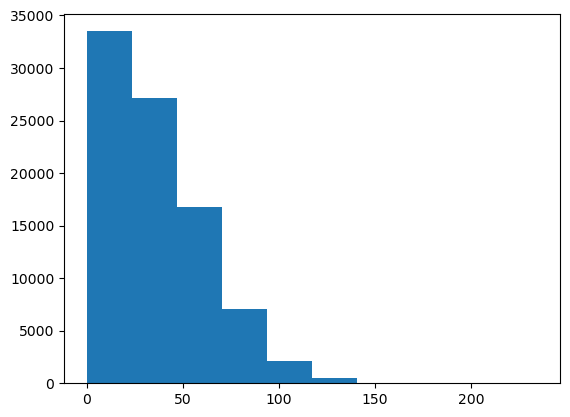

In [11]:
plt.hist(df['Air_Quality_Ozone'])
plt.show()

In [12]:
df.loc[df['Air_Quality_Ozone']==0.000000]['Country'].count()

1981

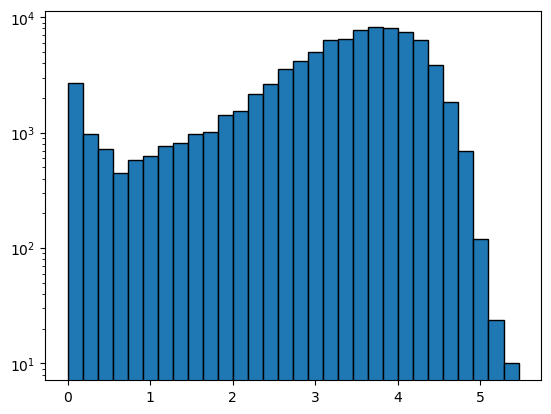

In [13]:
data = df['Air_Quality_Ozone']
log_data = num.log1p(data)
plt.hist(log_data, bins=30, edgecolor='black')
plt.yscale('log')
plt.show()

In [14]:
df['Air_Quality_Ozone']=df['Air_Quality_Ozone'].replace(0.000000,df['Air_Quality_Ozone'].median())

In [15]:
df.loc[df['Air_Quality_Ozone']==0.000000]['Country'].count()

0

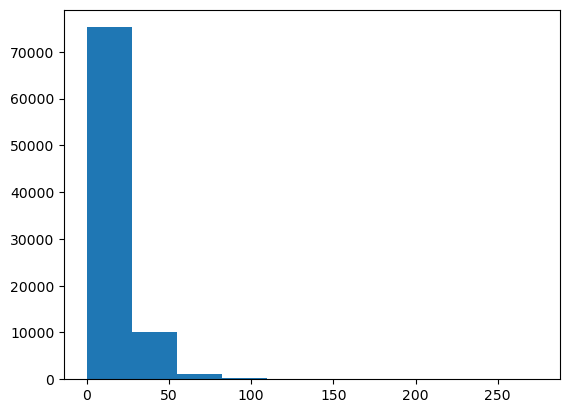

In [16]:
plt.hist(df['Air_Quality_Nitrogen_Dioxide'])
plt.show()

In [17]:
df.loc[df['Air_Quality_Nitrogen_Dioxide']==0.000000]['Country'].count()

8

In [18]:
df['Air_Quality_Nitrogen_Dioxide']=df['Air_Quality_Nitrogen_Dioxide'].replace(0.000000,df['Air_Quality_Nitrogen_Dioxide'].median())

In [19]:
df.loc[df['Air_Quality_Nitrogen_Dioxide']==0.000000]['Country'].count()

0

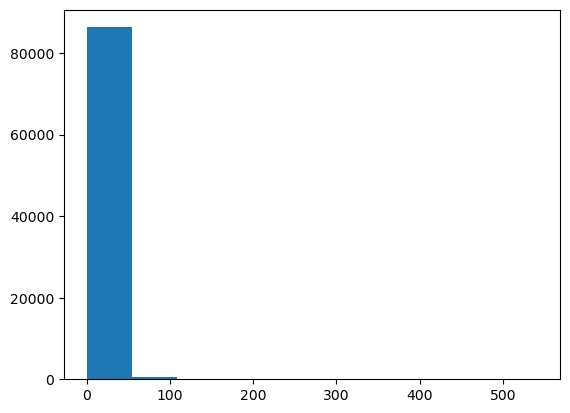

In [20]:
plt.hist(df['Air_Quality_Sulphur_Dioxide'])
plt.show()

In [21]:
df.loc[df['Air_Quality_Sulphur_Dioxide']==0.000000]['Country'].count()

269

In [22]:
df['Air_Quality_Sulphur_Dioxide']=df['Air_Quality_Sulphur_Dioxide'].replace(0.000000,df['Air_Quality_Sulphur_Dioxide'].median())

In [23]:
df.loc[df['Air_Quality_Sulphur_Dioxide']==0.000000]['Country'].count()

0

In [24]:
df.describe()

,Latitude,Longitude,Temperature_Celsius,Temperature_Fahrenheit,Wind_mph,Wind_kph,Wind_Degree,Humidity,Cloud,Feels_Like_Celsius,...,Uv_Index,Air_Quality_Carbon_Monoxide,Air_Quality_Ozone,Air_Quality_Nitrogen_Dioxide,Air_Quality_Sulphur_Dioxide,Air_Quality_PM2.5,Air_Quality_PM10,Air_Quality_Us-Epa-Index,Air_Quality_Gb-Defra-Index,Moon_Illumination
count,87108.000000,87108.000000,87108.000000,87108.000000,87108.000000,87108.000000,87108.000000,87108.000000,87108.000000,87108.000000,...,87108.000000,87108.000000,87108.000000,87108.000000,87108.000000,87108.000000,87108.000000,87108.000000,87108.000000,87108.000000
mean,23.097316,80.243005,19.588391,67.259260,4.699157,7.567995,152.044657,67.211680,26.015257,20.431526,...,1.116155,811.959233,36.533087,14.790885,5.852151,101.724954,118.537940,3.379724,6.887645,51.833196
std,5.792509,5.760193,6.141436,11.054386,2.618973,4.206448,114.380624,21.073995,31.192957,7.340706,...,0.822097,676.519742,26.088501,15.366982,12.086555,103.216276,116.062627,1.487496,3.569295,34.829528
min,7.170000,68.970000,-30.500000,-22.800000,2.200000,3.600000,1.000000,10.000000,0.000000,-36.500000,...,1.000000,113.500000,0.100000,0.100000,0.100000,0.500000,0.600000,1.000000,1.000000,0.000000
25%,20.270000,76.070000,16.000000,60.800000,2.500000,4.000000,52.000000,49.000000,2.000000,16.000000,...,1.000000,427.300000,16.500000,5.200000,1.400000,30.300000,38.600000,2.000000,3.000000,18.000000
50%,23.950000,78.690000,20.700000,69.300000,4.000000,6.500000,113.000000,69.000000,10.000000,20.700000,...,1.000000,607.500000,31.100000,10.400000,3.000000,69.400000,84.600000,4.000000,9.000000,52.000000
75%,26.770000,83.900000,24.000000,75.200000,5.800000,9.400000,266.000000,87.000000,49.000000,25.900000,...,1.000000,988.000000,52.200000,19.400000,6.000000,136.200000,157.500000,4.000000,10.000000,86.000000
max,34.570000,95.800000,38.300000,100.900000,26.800000,43.200000,360.000000,100.000000,100.000000,50.500000,...,9.000000,13565.100000,234.600000,274.200000,541.700000,1374.800000,1537.800000,6.000000,10.000000,100.000000


#### "describe" command shows us the nummerical summary of the variable which consists of nummerical dtype, In this dataset variables: Latitude, longtitude, last_updated_epoch, temperature_celsius, temperature_fahrenheit, wind_mph, wind_kph, wind_degree, pressure_mb, pressure_in, gust_kph, air_quality_Carbon_Monoxide, air_quality_Ozone,air_quality_Nitrogen_dioxide, air_quality_Sulphur_dioxide, moon_illumination it shows the statistical measures like mean, count, std,max and min also.

In [25]:
df['Region'].value_counts()

Region
Uttar Pradesh                  9704
Madhya Pradesh                 7630
Rajasthan                      5794
Andhra Pradesh                 5200
Maharashtra                    5107
Bihar                          4614
Tamil Nadu                     4452
Orissa                         3952
Gujarat                        3680
Karnataka                      3675
Chhattisgarh                   3656
Assam                          3361
West Bengal                    3328
Haryana                        3180
Jammu and Kashmir              3166
Punjab                         3021
Jharkhand                      2862
Kerala                         2226
Uttarakhand                    1749
Manipur                        1276
Mizoram                        1113
Nagaland                        953
Himachal Pradesh                795
Tripura                         379
Goa                             327
Delhi                           318
Puducherry                      318
Arunachal Pradesh    

#### "value_counts" command shows how many of values are present in that particular variable, in this we have taken the "region" variable.

In [26]:
df['Condition_Text'].value_counts()

Condition_Text
Clear                                          45621
Mist                                           11894
Partly cloudy                                   8544
Patchy rain possible                            5126
Clear                                           4382
Light rain shower                               2765
Fog                                             1964
Overcast                                        1490
Cloudy                                          1367
Sunny                                            772
Partly Cloudy                                    544
Light rain                                       451
Moderate or heavy rain shower                    389
Patchy rain nearby                               258
Light drizzle                                    252
Patchy light drizzle                             204
Moderate rain                                    164
Moderate or heavy rain with thunder              161
Patchy light rain              

#### "value_counts" command shows how many of values are present in that particular variable, in this we have taken the "condition_text" variable.

In [27]:
region_temperature_counts = df.groupby('Temperature_Fahrenheit')['Location_Name'].value_counts().groupby(level=1).nlargest()
print(region_temperature_counts)

Location_Name  Temperature_Fahrenheit  Location_Name
Adilabad       73.4                    Adilabad         5
               68.3                    Adilabad         4
               75.2                    Adilabad         4
               64.4                    Adilabad         3
               65.3                    Adilabad         3
                                                       ..
Zunheboto      44.6                    Zunheboto        6
               48.6                    Zunheboto        4
               63.3                    Zunheboto        4
               43.2                    Zunheboto        3
               43.9                    Zunheboto        3
Name: count, Length: 2753, dtype: int64


In [28]:
df['Location_Name'].value_counts()

Location_Name
Udaipur          311
Nagar            279
East Godavari    272
Siang            261
Barddhaman       227
                ... 
Enounga            7
Moshoit            5
Laful              4
Alipur             3
Rangachang         2
Name: count, Length: 552, dtype: int64

#### "value_counts" command shows how many of values are present in that particular variable, in this we have taken the "location_name" variable.

In [29]:
pd.set_option('display.max_columns',None)
print(df)

      Country Location_Name          Region  Latitude  Longitude  \
0       India    Ashoknagar  Madhya Pradesh     24.57      77.72   
1       India        Raisen  Madhya Pradesh     23.33      77.80   
2       India    Chhindwara  Madhya Pradesh     22.07      78.93   
3       India         Betul  Madhya Pradesh     21.86      77.93   
4       India   Hoshangabad  Madhya Pradesh     22.75      77.72   
...       ...           ...             ...       ...        ...   
87103   India        Niwari   Uttar Pradesh     28.88      77.53   
87104   India       Saitual         Mizoram     23.97      92.58   
87105   India       Ranipet      Tamil Nadu     12.93      79.33   
87106   India       Tenkasi      Tamil Nadu      8.97      77.30   
87107   India        Pendra     Maharashtra     21.93      74.15   

           Timezone      Last_Updated  Temperature_Celsius  \
0      Asia/Kolkata  29-08-2023 10:45                 27.5   
1      Asia/Kolkata  29-08-2023 10:45                 27.5 

#### To show us the number of columns from the first data till the last data

In [30]:
region_temperature_counts = df.groupby('Temperature_Fahrenheit')['Region'].value_counts()
top_10_regions = region_temperature_counts.groupby(level=1).nlargest(10)
print(top_10_regions)

Region                       Temperature_Fahrenheit  Region                     
Andaman and Nicobar Islands  81.5                    Andaman and Nicobar Islands    10
                             81.9                    Andaman and Nicobar Islands     9
                             81.6                    Andaman and Nicobar Islands     8
                             81.7                    Andaman and Nicobar Islands     8
                             82.2                    Andaman and Nicobar Islands     8
                                                                                    ..
West Bengal                  64.4                    West Bengal                    70
                             82.4                    West Bengal                    63
                             69.8                    West Bengal                    62
                             75.2                    West Bengal                    59
                             84.2                

#### We have grouped the data with two variable "region" and "temperature_fahrenheit", where we can see based on their region wise see minimum how many temperature had.

In [31]:
df_filtered = df[df['Temperature_Fahrenheit'] > 82]
region_temperature_counts = df_filtered.groupby('Region')['Temperature_Fahrenheit'].value_counts()
top_10_regions = region_temperature_counts.groupby(level=0).nlargest()
print(top_10_regions)

Region                       Region                       Temperature_Fahrenheit
Andaman and Nicobar Islands  Andaman and Nicobar Islands  82.2                       8
                                                          82.3                       4
                                                          82.5                       4
                                                          82.7                       4
                                                          82.1                       3
                                                                                    ..
West Bengal                  West Bengal                  82.4                      63
                                                          84.2                      52
                                                          86.0                      18
                                                          83.8                      11
                                                 

In [32]:
pd.DataFrame(
    df.groupby(
        by='Region'
    )['Temperature_Fahrenheit'].max()
).reset_index().head(10)

,Region,Temperature_Fahrenheit
0,Andaman and Nicobar Islands,89.6
1,Andhra Pradesh,95.5
2,Arunachal Pradesh,88.0
3,Assam,89.6
4,Bihar,93.2
5,Chandigarh,86.2
6,Chhattisgarh,87.6
7,Dadra and Nagar Haveli,82.9
8,Daman and Diu,83.5
9,Delhi,91.4


#### We have grouped the data with two variable "region" and "temperature_fahrenheit", where we can see based on their region wise see maximum how many temperature had

In [33]:
tempreature = df.groupby(
    by='Region'
)['Temperature_Fahrenheit'].min() 
pd.DataFrame(tempreature).reset_index().head(10)

,Region,Temperature_Fahrenheit
0,Andaman and Nicobar Islands,51.8
1,Andhra Pradesh,58.1
2,Arunachal Pradesh,18.7
3,Assam,49.2
4,Bihar,44.6
5,Chandigarh,46.1
6,Chhattisgarh,47.8
7,Dadra and Nagar Haveli,66.5
8,Daman and Diu,65.1
9,Delhi,44.6


#### create a new variable called "tempreature" in which it is used to show the minimum of each data in "region" with "temperature_fahrenheit". "Uttarakhand	" has the least of 4.09 and "Lakshadweep" has the highest of 79.02.

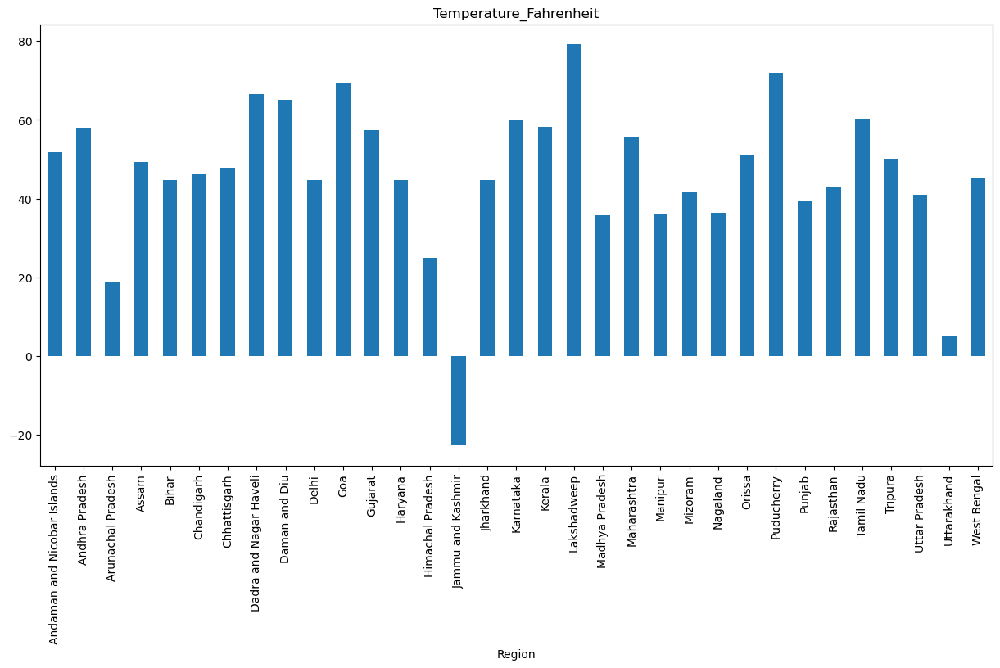

In [34]:
tempreature.plot(
    kind='bar',
    figsize=(15, 7),
    subplots=True,
)

plt.show()

#### Created a Bar chart for "temperature_fahrenheit" in which it shows us the tempreature of each region. "Uttarakhand" had the least of 4.09 and "Lakshadweep" had the highest of 79.02

In [35]:
tempreature1 = df.groupby(
    by='Region'
)['Temperature_Fahrenheit'].max() 
pd.DataFrame(tempreature1).reset_index().head(10)

,Region,Temperature_Fahrenheit
0,Andaman and Nicobar Islands,89.6
1,Andhra Pradesh,95.5
2,Arunachal Pradesh,88.0
3,Assam,89.6
4,Bihar,93.2
5,Chandigarh,86.2
6,Chhattisgarh,87.6
7,Dadra and Nagar Haveli,82.9
8,Daman and Diu,83.5
9,Delhi,91.4


#### create a new variable called "tempreature 1" in which it is used to show the maximum of each data in "region" with "temperature_fahrenheit". "Uttarakhand " has the least of 4.09 and "Lakshadweep" has the highest of 79.02.

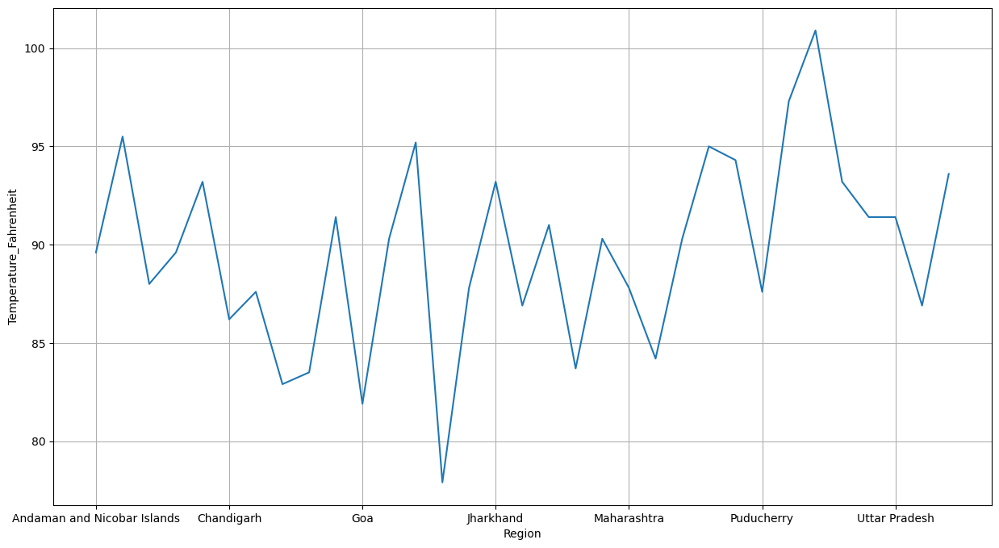

In [36]:
ax=tempreature1.plot(
  grid=True,
  figsize=(15,8)
)
ax.set_xlabel('Region')
ax.set_ylabel('Temperature_Fahrenheit')
plt.show()

#### Created a Bar chart for "temperature_fahrenheit" in which it shows us the tempreature of each region. "Himachal Pradesh" had the least of 75 and "Rajasthan" had the highest of 101.

In [37]:
moon_illumination = pd.pivot_table(df,
    index='Condition_Text',
    columns='Region',
    values='Moon_Illumination'
)
moon_illumination.reset_index().head(10)

Region,Condition_Text,Andaman and Nicobar Islands,Andhra Pradesh,Arunachal Pradesh,Assam,Bihar,Chandigarh,Chhattisgarh,Dadra and Nagar Haveli,Daman and Diu,Delhi,Goa,Gujarat,Haryana,Himachal Pradesh,Jammu and Kashmir,Jharkhand,Karnataka,Kerala,Lakshadweep,Madhya Pradesh,Maharashtra,Manipur,Mizoram,Nagaland,Orissa,Puducherry,Punjab,Rajasthan,Tamil Nadu,Tripura,Uttar Pradesh,Uttarakhand,West Bengal
0,Clear,67.823529,46.854470,49.056180,50.548427,48.096034,51.208000,47.647664,50.610000,51.872146,90.571429,52.715278,51.827110,51.087500,52.482935,53.117812,48.115214,49.384446,56.842593,49.775862,51.801027,50.845528,53.967213,51.391489,53.169054,48.394687,56.162791,50.890909,52.198600,53.405446,48.360656,51.144970,51.972707,49.036466
1,Clear,28.000000,62.486804,96.000000,72.455882,67.975610,51.166667,63.375000,63.461538,63.461538,NaN,61.071429,63.278431,61.087379,45.125000,49.841463,67.606557,63.519313,63.000000,73.500000,62.215078,63.000000,69.581081,69.588235,77.918919,64.165714,54.526316,55.558559,63.160883,58.713287,65.206897,64.560254,60.214286,70.826772
2,Cloudy,45.777778,52.594595,50.666667,41.264706,49.739130,NaN,56.797619,84.000000,81.000000,NaN,72.500000,46.519231,58.958333,35.400000,36.342857,65.173913,46.756757,43.368421,52.625000,43.135417,39.072993,22.588235,60.000000,69.600000,50.200000,42.333333,60.750000,36.363636,41.853211,NaN,49.411111,52.181818,48.178571
3,Cloudy,40.000000,86.800000,NaN,46.750000,NaN,99.000000,56.750000,NaN,NaN,NaN,NaN,NaN,73.600000,96.500000,93.230769,40.000000,NaN,NaN,NaN,96.666667,NaN,NaN,30.000000,NaN,NaN,NaN,88.750000,53.625000,73.000000,NaN,73.000000,95.000000,38.333333
4,Fog,62.500000,NaN,25.000000,33.054545,64.989130,NaN,44.767857,NaN,NaN,63.576923,NaN,NaN,67.597015,NaN,NaN,54.717647,54.454545,58.604651,NaN,37.564356,61.533333,46.201521,45.069343,38.650000,62.641026,NaN,56.969231,58.833333,52.714286,50.680000,63.632399,NaN,35.360000
5,Heavy rain,92.000000,81.600000,NaN,44.750000,51.666667,NaN,1.000000,NaN,NaN,NaN,NaN,2.000000,NaN,NaN,NaN,75.000000,66.400000,79.500000,NaN,0.166667,93.000000,NaN,82.666667,NaN,NaN,NaN,NaN,NaN,42.666667,NaN,NaN,NaN,59.750000
6,Heavy rain at times,NaN,52.000000,NaN,49.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,94.000000,8.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,Heavy snow,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,56.272727,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,Light drizzle,91.000000,51.160000,69.000000,46.800000,68.083333,NaN,67.500000,NaN,NaN,NaN,84.000000,3.000000,NaN,NaN,73.950000,56.636364,61.000000,47.500000,80.000000,25.500000,46.125000,22.000000,44.800000,48.166667,64.857143,16.333333,NaN,15.000000,43.137931,17.000000,62.066667,84.666667,47.000000
9,Light freezing rain,NaN,NaN,57.727273,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.000000,49.050000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,29.000000,NaN


The pivot table shows the moon illumination for condion_text(weather). condition_text is clear or heavy rain,on that moment the moon illumination had knew for good. Other time the moon illumination was know low.

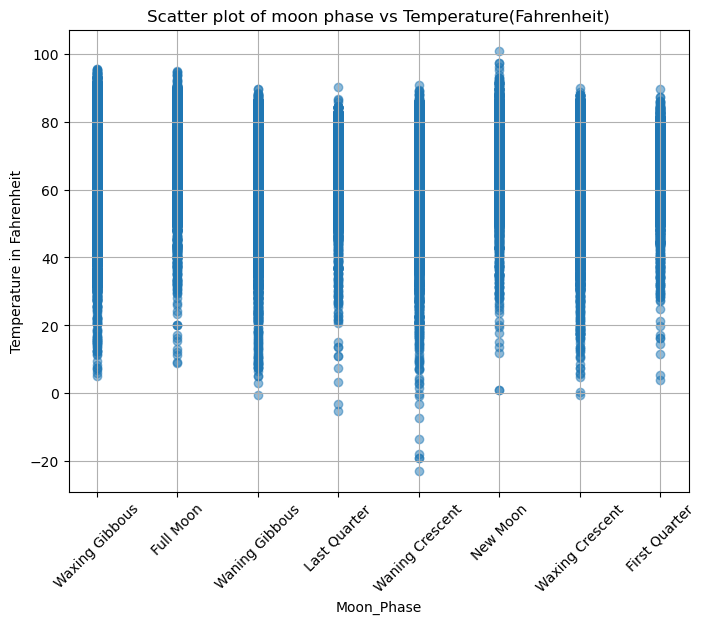

In [38]:
Moon_Phase = df['Moon_Phase']
Fahrenheit = df['Temperature_Fahrenheit']

plt.figure(figsize=(8,6))
plt.scatter(Moon_Phase,Fahrenheit,alpha=0.5)
plt.title("Scatter plot of moon phase vs Temperature(Fahrenheit)")
plt.xlabel("Moon_Phase")
plt.ylabel("Temperature in Fahrenheit")
plt.xticks(rotation=45) 
plt.grid(True)
plt.show()

In [39]:
air_quality = df.groupby(
    by='Region'
)['Air_Quality_Nitrogen_Dioxide'].max()
pd.DataFrame(air_quality).sort_values(by='Air_Quality_Nitrogen_Dioxide',ascending=False).reset_index().head(10)

,Region,Air_Quality_Nitrogen_Dioxide
0,Haryana,274.2
1,West Bengal,268.7
2,Delhi,266.0
3,Chhattisgarh,227.6
4,Uttar Pradesh,222.1
5,Punjab,222.1
6,Maharashtra,189.2
7,Jharkhand,111.0
8,Gujarat,109.7
9,Andhra Pradesh,106.9


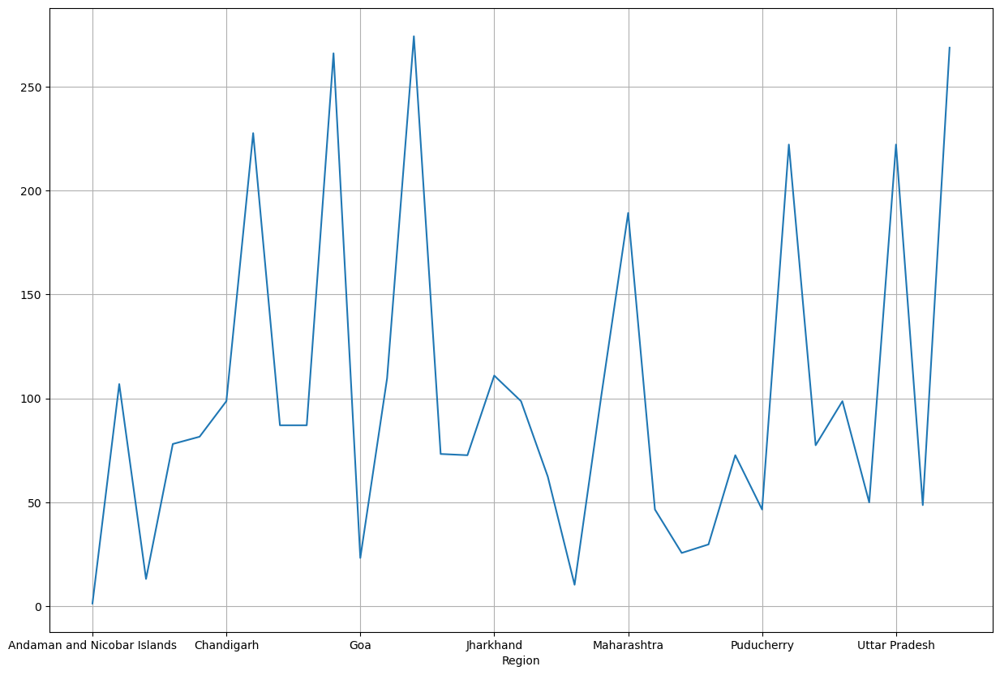

In [40]:
axxx=air_quality.plot(
  grid=True,
  figsize=(15,10)
)
ax.set_xlabel('Region')
ax.set_ylabel('Air Quality Nitrogen Dioxide')
plt.show()


#### We use the maximum function to find that nitrogen dioxide is needed for 100 ppb in the air in perhour. Nitrogen dioxide can be useful for increasing the human body's lung function. But in case the nitrogen dioxide below 100 in the air can irritate your eyes, nose, throat, and lungs, possibly causing you to cough and experience shortness of breath, tiredness, and nausea. The places of Haryana, West Bengal, Delhi, Chhattisgarh, Uttar Pradesh, Punjab, Maharashtra, Jharkhand, Gujarat, Andhra Pradesh, and Madhya Pradesh had high levels of nitrogen dioxide.

In [41]:
air_quality_1= df.groupby(
    by='Region'
)['Air_Quality_Nitrogen_Dioxide'].mean()
pd.DataFrame(air_quality_1).sort_values(by='Air_Quality_Nitrogen_Dioxide',ascending=False).reset_index().head(10)

,Region,Air_Quality_Nitrogen_Dioxide
0,Delhi,52.151572
1,West Bengal,30.287770
2,Haryana,28.901384
3,Chandigarh,28.405031
4,Punjab,25.918438
5,Bihar,23.466407
6,Uttar Pradesh,21.712242
7,Himachal Pradesh,20.950440
8,Jammu and Kashmir,17.114656
9,Tripura,14.430871


#### We used the mean function to find that Nitrogen dioxide does not affect the human body places in Tamil Nadu, Kerala, Orissa, Gujarat, Karnataka, Andhra Pradesh, Puducherry, Goa, Madhya Pradesh, Daman and Diu, Uttarakhand, Manipur, Nagaland, Mizoram, Arunachal Pradesh, Andaman and Nicobar Islands, Lakshadweep.

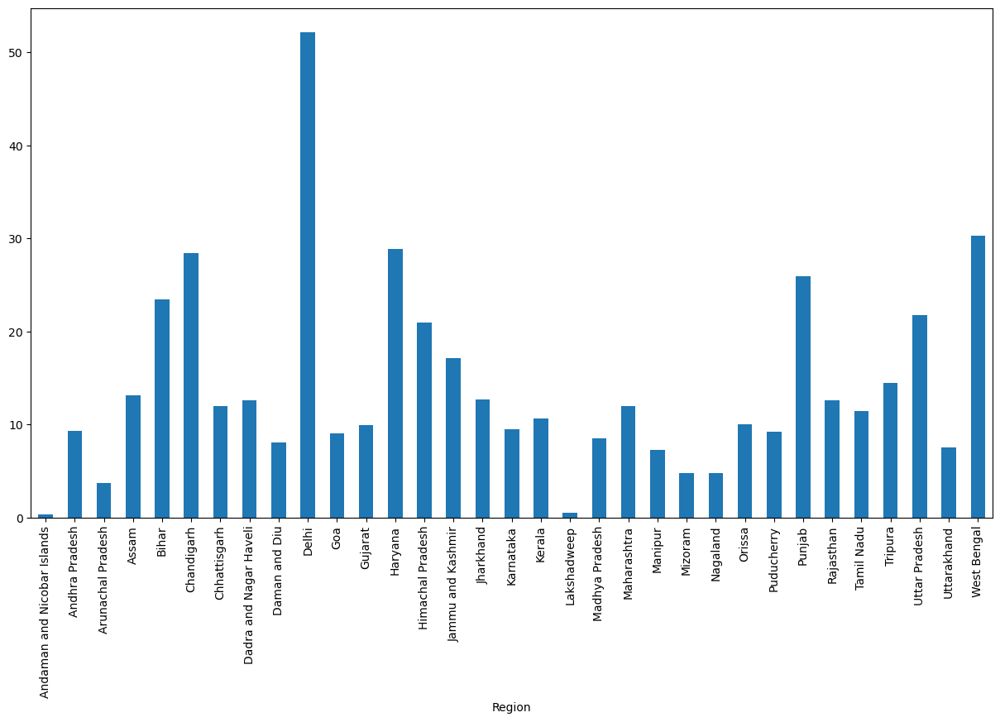

In [42]:
axx=air_quality_1.plot(
  figsize=(15,8),
    kind='bar'
)
ax.set_xlabel('Region')
ax.set_ylabel('Air Quality Nitrogen Dioxide')
plt.show()

In [43]:
df.loc[df['Air_Quality_Nitrogen_Dioxide'] > 100]['Region'].unique()
#df1.loc['Region']

array(['Haryana', 'West Bengal', 'Delhi', 'Punjab', 'Maharashtra',
       'Chhattisgarh', 'Madhya Pradesh', 'Uttar Pradesh', 'Jharkhand',
       'Gujarat', 'Andhra Pradesh'], dtype=object)

In [44]:
pd.to_datetime(df['Last_Updated'])

C:\Users\VIGNESH\AppData\Local\Temp\ipykernel_19996\2138994631.py:1: UserWarning: Parsing dates in %d-%m-%Y %H:%M format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  pd.to_datetime(df['Last_Updated'])


0       2023-08-29 10:45:00
1       2023-08-29 10:45:00
2       2023-08-29 10:45:00
3       2023-08-29 10:45:00
4       2023-08-29 10:45:00
                ...        
87103   2024-02-07 23:15:00
87104   2024-02-07 23:15:00
87105   2024-02-07 23:15:00
87106   2024-02-07 23:15:00
87107   2024-02-07 23:15:00
Name: Last_Updated, Length: 87108, dtype: datetime64[ns]

In [45]:
df['Last_Updated'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 87108 entries, 0 to 87107
Series name: Last_Updated
Non-Null Count  Dtype 
--------------  ----- 
87108 non-null  object
dtypes: object(1)
memory usage: 680.7+ KB


In [46]:
df['Last_Updated'] = pd.to_datetime(df['Last_Updated'])

# Create new columns for date and time
df['Date'] = df['Last_Updated'].dt.date
df['Time'] = df['Last_Updated'].dt.time

C:\Users\VIGNESH\AppData\Local\Temp\ipykernel_19996\2852436785.py:1: UserWarning: Parsing dates in %d-%m-%Y %H:%M format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  df['Last_Updated'] = pd.to_datetime(df['Last_Updated'])


In [47]:
pd.to_datetime(df['Date'])

0       2023-08-29
1       2023-08-29
2       2023-08-29
3       2023-08-29
4       2023-08-29
           ...    
87103   2024-02-07
87104   2024-02-07
87105   2024-02-07
87106   2024-02-07
87107   2024-02-07
Name: Date, Length: 87108, dtype: datetime64[ns]

In [48]:
nitrogen_matrix = pd.pivot_table(
    df,values='Air_Quality_Nitrogen_Dioxide',
    index='Region',
    columns='Date',
    aggfunc='max'
)
nitrogen_matrix.iloc[ :10, :10]

Date,2023-08-29,2023-08-30,2023-08-31,2023-09-01,2023-09-02,2023-09-03,2023-09-04,2023-09-05,2023-09-06,2023-09-07
Region,,,,,,,,,,
Andaman and Nicobar Islands,0.4,0.4,0.3,0.3,0.4,0.4,0.3,0.3,0.3,0.2
Andhra Pradesh,8.4,9.3,18.9,48.0,52.8,41.1,13.5,13.4,11.8,27.8
Arunachal Pradesh,0.3,3.5,4.2,1.6,1.6,1.5,2.1,1.8,3.8,2.9
Assam,28.1,11.8,16.5,14.1,29.5,17.1,11.8,13.4,19.9,13.9
Bihar,13.5,18.2,18.2,26.7,25.4,20.4,23.3,31.9,24.7,19.2
Chandigarh,7.8,9.7,9.2,10.4,9.4,10.6,14.9,8.5,15.9,21.8
Chhattisgarh,21.9,16.3,14.2,14.7,33.6,24.0,13.2,52.1,64.4,75.4
Dadra and Nagar Haveli,0.2,0.2,0.1,0.1,0.1,0.1,0.4,1.3,1.5,1.3
Daman and Diu,0.2,0.2,0.2,0.2,0.2,0.1,0.4,1.3,1.5,1.3


In [49]:
nitrogen_matrix = pd.pivot_table(
    df,values='Air_Quality_Sulphur_Dioxide',
    index='Region',
    columns='Date',
    aggfunc='max'
)
nitrogen_matrix.iloc[ :10, :10]

Date,2023-08-29,2023-08-30,2023-08-31,2023-09-01,2023-09-02,2023-09-03,2023-09-04,2023-09-05,2023-09-06,2023-09-07
Region,,,,,,,,,,
Andaman and Nicobar Islands,0.4,0.3,0.2,0.2,0.3,0.2,0.2,0.3,0.3,0.2
Andhra Pradesh,23.4,16.5,20.3,22.7,39.1,35.3,7.0,5.6,11.6,17.4
Arunachal Pradesh,3.0,0.4,0.2,3.0,0.3,0.1,0.2,0.2,0.4,0.3
Assam,8.8,9.7,4.8,4.3,8.1,5.2,6.4,4.1,7.5,3.1
Bihar,17.9,15.3,8.5,12.4,9.3,23.8,15.5,19.1,13.0,15.0
Chandigarh,26.9,4.7,1.9,2.1,1.3,1.5,2.3,8.1,3.7,4.2
Chhattisgarh,78.2,90.6,68.7,68.7,51.5,49.1,70.6,169.8,183.1,541.7
Dadra and Nagar Haveli,0.3,0.2,0.1,0.1,3.0,0.1,0.9,2.4,1.7,1.8
Daman and Diu,0.5,0.4,0.3,0.2,3.0,0.3,0.9,2.4,1.7,1.8


In [50]:
nitrogen_matrix = pd.pivot_table(
    df,values='Air_Quality_Ozone',
    index='Region',
    columns='Date',
    aggfunc='max'
)
nitrogen_matrix.iloc[ :10, :10]

Date,2023-08-29,2023-08-30,2023-08-31,2023-09-01,2023-09-02,2023-09-03,2023-09-04,2023-09-05,2023-09-06,2023-09-07
Region,,,,,,,,,,
Andaman and Nicobar Islands,22.9,26.8,31.5,27.5,27.2,31.5,38.3,27.5,46.5,55.1
Andhra Pradesh,105.9,87.3,50.1,84.4,108.7,68.7,56.5,71.5,60.1,57.2
Arunachal Pradesh,80.8,35.4,25.4,5.8,18.4,10.7,17.7,19.3,40.4,34.0
Assam,107.3,125.9,22.9,60.1,47.2,66.5,37.2,31.1,66.5,47.2
Bihar,124.5,78.7,44.0,77.3,87.3,65.8,32.9,18.4,57.2,39.3
Chandigarh,151.6,7.7,1.0,1.6,0.3,1.1,0.7,70.8,0.3,0.2
Chhattisgarh,100.1,70.1,37.2,44.7,31.1,58.7,56.5,53.6,40.1,31.1
Dadra and Nagar Haveli,34.7,31.5,29.3,29.3,28.3,27.5,32.2,38.6,32.2,32.9
Daman and Diu,34.7,35.4,32.2,29.3,29.3,33.6,34.3,38.6,36.5,35.8


In [51]:
air_quality_3= df.groupby(
    by='Region'
)['Air_Quality_Sulphur_Dioxide'].max()
pd.DataFrame(air_quality_3).sort_values(by='Air_Quality_Sulphur_Dioxide',ascending=False).reset_index().head(10)

,Region,Air_Quality_Sulphur_Dioxide
0,Chhattisgarh,541.7
1,West Bengal,473.0
2,Haryana,331.9
3,Delhi,289.9
4,Maharashtra,234.6
5,Uttar Pradesh,181.2
6,Gujarat,101.1
7,Andhra Pradesh,100.1
8,Jharkhand,99.2
9,Dadra and Nagar Haveli,94.4


#### We use the maximum function to find that Sulphur Dioxide is needed for 100 ppb in the air in perhour. Sulphur Dioxide can be useful for increasing the human body's lung function. But in case the Sulphur Dioxide below 100 in the air can irritate your eyes. The places of 	West Benga, 2	Harya, 
3	De, 
4	Maharas, 6
5	Uttar Pradesh, .2
6	G, and 1.1
7	Andhra Pradesh had high levels of nitrogen dioxide.

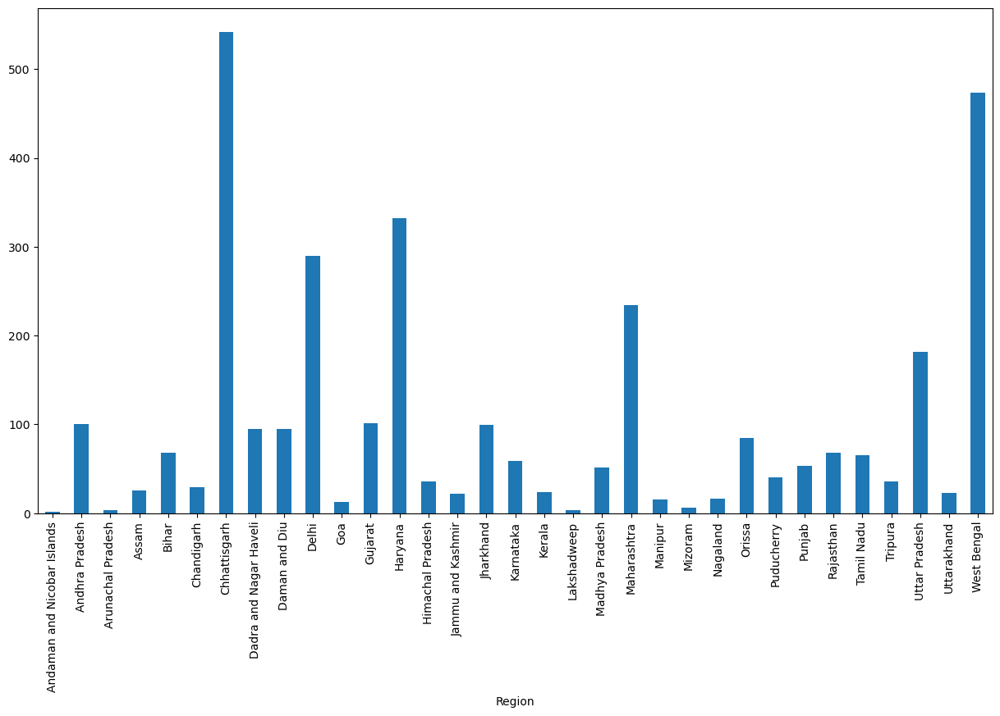

In [52]:
axxx=air_quality_3.plot(
  figsize=(15,8),
    kind='bar'
)
ax.set_xlabel('Region')
ax.set_ylabel('Air Quality Sulphur Dioxide')
plt.show()

In [53]:
air_quality_4= df.groupby(
    by='Region'
)['Air_Quality_Carbon_Monoxide'].max()
pd.DataFrame(air_quality_4).sort_values(by='Air_Quality_Carbon_Monoxide',ascending=False).reset_index().head(10)

,Region,Air_Quality_Carbon_Monoxide
0,West Bengal,13565.1
1,Haryana,12497.0
2,Delhi,12176.5
3,Uttar Pradesh,9506.2
4,Punjab,9506.2
5,Maharashtra,7263.2
6,Chhattisgarh,4379.3
7,Chandigarh,4112.2
8,Andhra Pradesh,3524.8
9,Bihar,3337.9


In [54]:
df.loc[df['Air_Quality_Carbon_Monoxide'] < 273]['Region'].head(10).unique()

array(['Madhya Pradesh'], dtype=object)

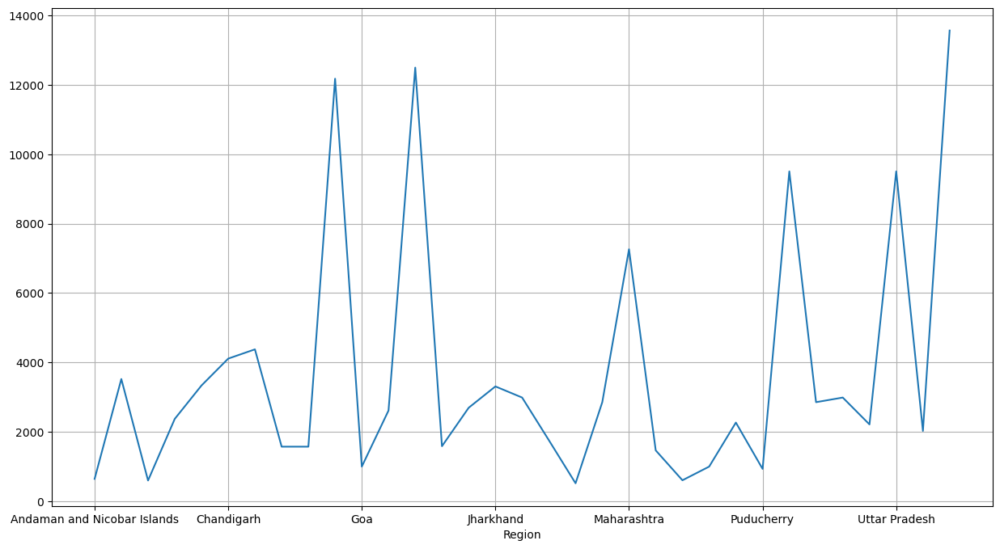

In [55]:
axxxx=air_quality_4.plot(
  figsize=(15,8),
    grid="True"

)
ax.set_xlabel('Region')
ax.set_ylabel('Air_Quality_Carbon_Monoxide')
plt.show()

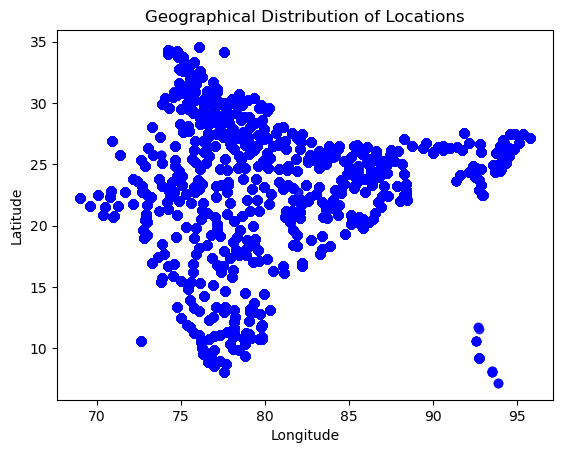

In [56]:
plt.scatter(df['Longitude'], df['Latitude'], alpha=0.5, color='blue')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Geographical Distribution of Locations')
plt.show()

In [57]:
air_quality_5= df.groupby(
    by='Region'
)['Air_Quality_Ozone'].max()
pd.DataFrame(air_quality_5).sort_values(by='Air_Quality_Ozone',ascending=False).reset_index().head(10)

,Region,Air_Quality_Ozone
0,Maharashtra,234.6
1,Punjab,171.7
2,Orissa,165.9
3,Kerala,164.5
4,Jammu and Kashmir,164.5
5,Daman and Diu,161.7
6,Gujarat,161.7
7,Rajasthan,155.9
8,Haryana,153.1
9,Karnataka,153.1


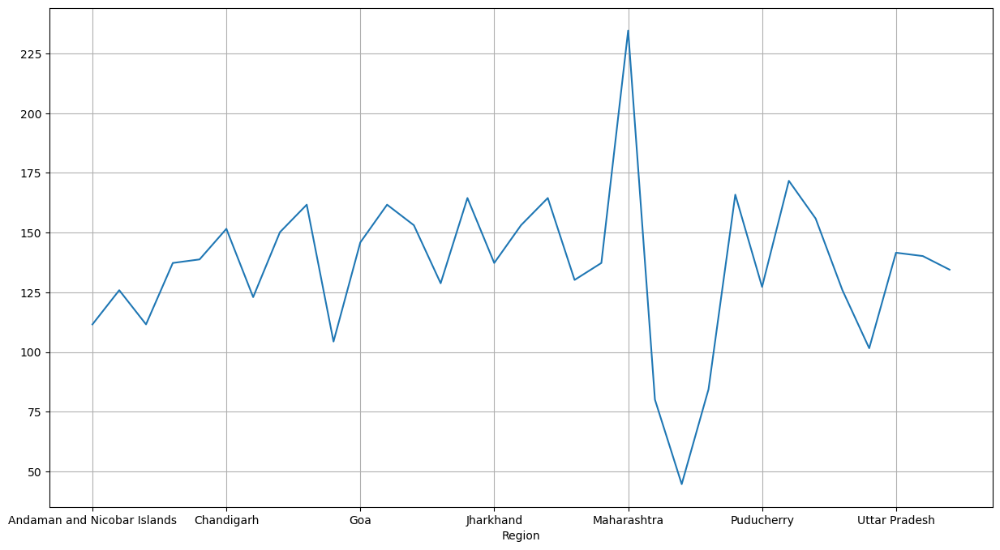

In [58]:
axxxz=air_quality_5.plot(
  figsize=(15,8),
    grid="True"

)
ax.set_xlabel('Region')
ax.set_ylabel('Air_Quality_Carbon_Monoxide')
plt.show()

In [59]:
wind_matrix = pd.pivot_table(
    df,values='Wind_mph',
    index='Region',
    columns='Date',
    aggfunc='max'
)
nitrogen_matrix.iloc[ :10, :10]

Date,2023-08-29,2023-08-30,2023-08-31,2023-09-01,2023-09-02,2023-09-03,2023-09-04,2023-09-05,2023-09-06,2023-09-07
Region,,,,,,,,,,
Andaman and Nicobar Islands,22.9,26.8,31.5,27.5,27.2,31.5,38.3,27.5,46.5,55.1
Andhra Pradesh,105.9,87.3,50.1,84.4,108.7,68.7,56.5,71.5,60.1,57.2
Arunachal Pradesh,80.8,35.4,25.4,5.8,18.4,10.7,17.7,19.3,40.4,34.0
Assam,107.3,125.9,22.9,60.1,47.2,66.5,37.2,31.1,66.5,47.2
Bihar,124.5,78.7,44.0,77.3,87.3,65.8,32.9,18.4,57.2,39.3
Chandigarh,151.6,7.7,1.0,1.6,0.3,1.1,0.7,70.8,0.3,0.2
Chhattisgarh,100.1,70.1,37.2,44.7,31.1,58.7,56.5,53.6,40.1,31.1
Dadra and Nagar Haveli,34.7,31.5,29.3,29.3,28.3,27.5,32.2,38.6,32.2,32.9
Daman and Diu,34.7,35.4,32.2,29.3,29.3,33.6,34.3,38.6,36.5,35.8


In [60]:
wind= df.groupby(
    by='Region'
)['Wind_mph'].max()
pd.DataFrame(wind).sort_values(by='Wind_mph',ascending=False).reset_index().head(10)

,Region,Wind_mph
0,Andaman and Nicobar Islands,26.8
1,Andhra Pradesh,26.4
2,Maharashtra,23.5
3,Tamil Nadu,23.3
4,Rajasthan,22.6
5,Madhya Pradesh,22.6
6,Gujarat,21.7
7,Puducherry,21.7
8,Lakshadweep,20.8
9,Punjab,20.6


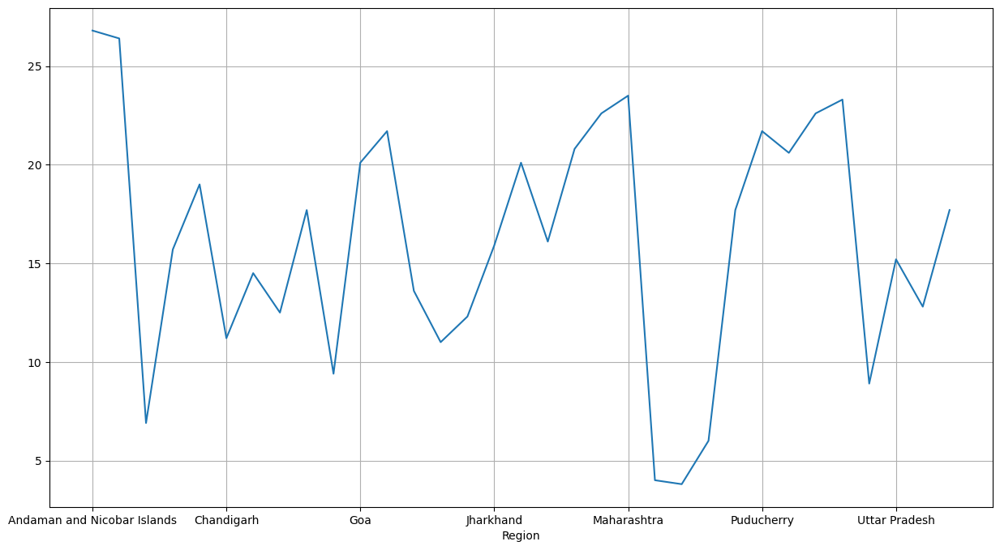

In [61]:
b=wind.plot(
  figsize=(15,8),
    grid="True"

)
ax.set_xlabel('Region')
ax.set_ylabel('Wind_mph')
plt.show()

#### The wind had moderated so only small branches were moved and dust and loose paper lifted.

In [62]:
weather_df= df.select_dtypes(include = 'number')
cols = weather_df.columns.values
cols

array(['Latitude', 'Longitude', 'Temperature_Celsius',
       'Temperature_Fahrenheit', 'Wind_mph', 'Wind_kph', 'Wind_Degree',
       'Humidity', 'Cloud', 'Feels_Like_Celsius', 'Feels_Like_Fahrenheit',
       'Visibility_km', 'Visibility_Miles', 'Uv_Index',
       'Air_Quality_Carbon_Monoxide', 'Air_Quality_Ozone',
       'Air_Quality_Nitrogen_Dioxide', 'Air_Quality_Sulphur_Dioxide',
       'Air_Quality_PM2.5', 'Air_Quality_PM10',
       'Air_Quality_Us-Epa-Index', 'Air_Quality_Gb-Defra-Index',
       'Moon_Illumination'], dtype=object)

In [63]:
weather_df.drop(['Temperature_Celsius','Wind_mph','Feels_Like_Celsius','Visibility_km'], axis=1,inplace=True)
weather_df.columns

Index(['Latitude', 'Longitude', 'Temperature_Fahrenheit', 'Wind_kph',
       'Wind_Degree', 'Humidity', 'Cloud', 'Feels_Like_Fahrenheit',
       'Visibility_Miles', 'Uv_Index', 'Air_Quality_Carbon_Monoxide',
       'Air_Quality_Ozone', 'Air_Quality_Nitrogen_Dioxide',
       'Air_Quality_Sulphur_Dioxide', 'Air_Quality_PM2.5', 'Air_Quality_PM10',
       'Air_Quality_Us-Epa-Index', 'Air_Quality_Gb-Defra-Index',
       'Moon_Illumination'],
      dtype='object')

In [64]:
weather_df.columns

Index(['Latitude', 'Longitude', 'Temperature_Fahrenheit', 'Wind_kph',
       'Wind_Degree', 'Humidity', 'Cloud', 'Feels_Like_Fahrenheit',
       'Visibility_Miles', 'Uv_Index', 'Air_Quality_Carbon_Monoxide',
       'Air_Quality_Ozone', 'Air_Quality_Nitrogen_Dioxide',
       'Air_Quality_Sulphur_Dioxide', 'Air_Quality_PM2.5', 'Air_Quality_PM10',
       'Air_Quality_Us-Epa-Index', 'Air_Quality_Gb-Defra-Index',
       'Moon_Illumination'],
      dtype='object')

In [65]:
correlation_cols = [
    'Latitude', 'Longitude', 'Humidity',
    'Temperature_Fahrenheit', 'Wind_mph','Wind_Degree',
    'Cloud','Feels_Like_Fahrenheit','Visibility_Miles','Uv_Index','Air_Quality_Carbon_Monoxide','Air_Quality_Ozone',
    'Air_Quality_Nitrogen_Dioxide','Air_Quality_Sulphur_Dioxide','Air_Quality_PM2.5','Air_Quality_PM10',
    'Air_Quality_Us-Epa-Index','Air_Quality_Gb-Defra-Index','Moon_Illumination','Air_Quality_Ozone'
]
correlation_matrix = df[correlation_cols].corr()

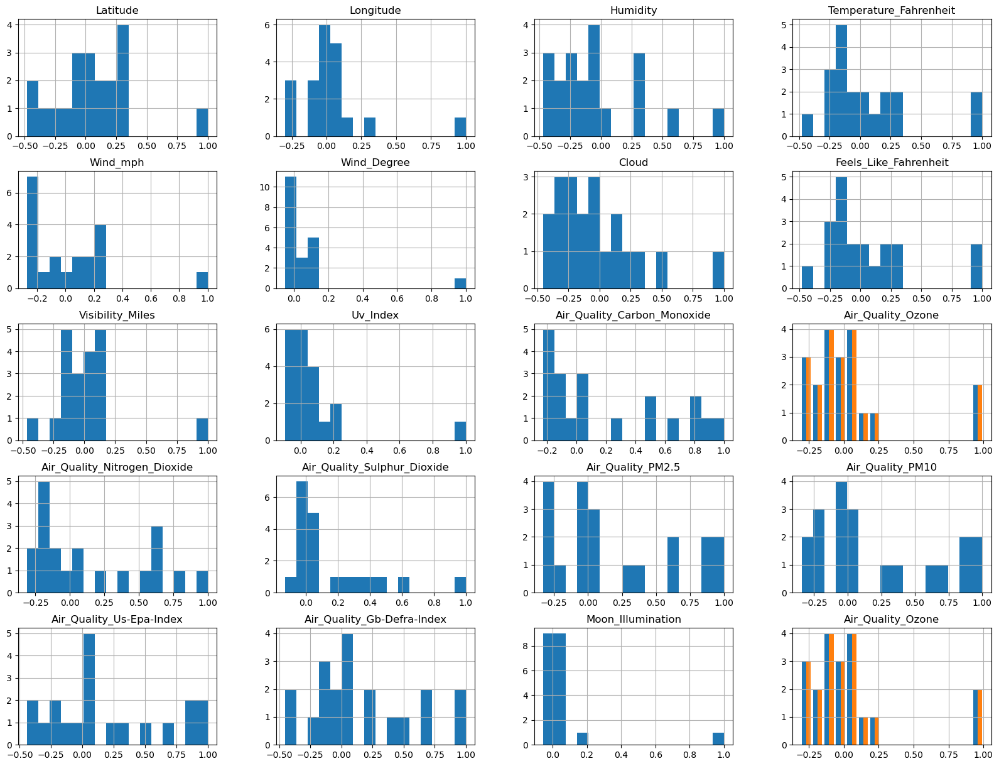

In [66]:
correlation_matrix.hist(bins=16, figsize=(20,15));

Text(0.5, 1.0, 'correlation of feature')

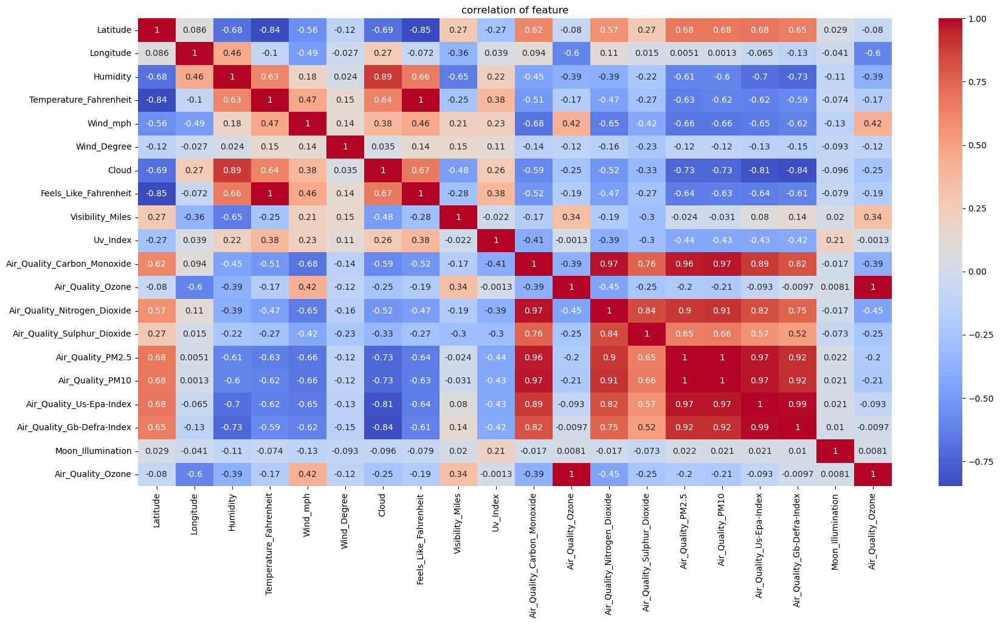

In [67]:
plt.figure(figsize=(20,10))
sns.heatmap(correlation_matrix.corr(),annot=True,cmap='coolwarm')
plt.title("correlation of feature")

In [68]:
sorted_corr_mat = correlation_matrix.abs().unstack().sort_values()
sorted_corr_mat = sorted_corr_mat.to_frame(name="Correlation")

# Removing highly/ least correlated data (correlation>0.90 && <0.05)
sorted_corr_mat=sorted_corr_mat.drop(sorted_corr_mat[sorted_corr_mat['Correlation']>0.95].index)
sorted_corr_mat=sorted_corr_mat.drop(sorted_corr_mat[sorted_corr_mat['Correlation']<0.05].index)
print("Fields with max correlation are:\n")

sorted_corr_mat[sorted_corr_mat['Correlation']>0.80]

Fields with max correlation are:



Correlation
Air_Quality_Nitrogen_Dioxide Air_Quality_Carbon_Monoxide      0.819866
Air_Quality_Carbon_Monoxide  Air_Quality_Nitrogen_Dioxide     0.819866
                             Air_Quality_PM2.5                0.841526
Air_Quality_PM2.5            Air_Quality_Carbon_Monoxide      0.841526
Air_Quality_Us-Epa-Index     Air_Quality_PM10                 0.844267
Air_Quality_PM10             Air_Quality_Us-Epa-Index         0.844267
Air_Quality_Us-Epa-Index     Air_Quality_PM2.5                0.847702
Air_Quality_PM2.5            Air_Quality_Us-Epa-Index         0.847702
Air_Quality_PM10             Air_Quality_Carbon_Monoxide      0.864993
Air_Quality_Carbon_Monoxide  Air_Quality_PM10                 0.864993
Air_Quality_Us-Epa-Index     Air_Quality_Gb-Defra-Index       0.912573
Air_Quality_Gb-Defra-Index   Air_Quality_Us-Epa-Index         0.912573

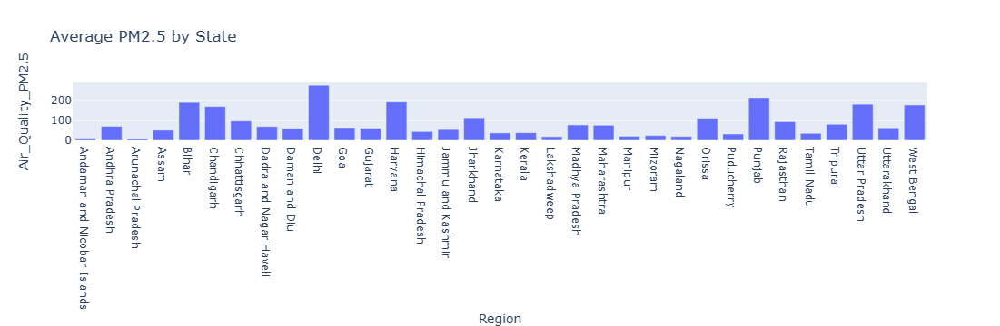

In [69]:
fig1=px.bar(df.groupby('Region')['Air_Quality_PM2.5'].mean().reset_index(),
           x='Region', y='Air_Quality_PM2.5', 
           title='Average PM2.5 by State')
fig1.show()

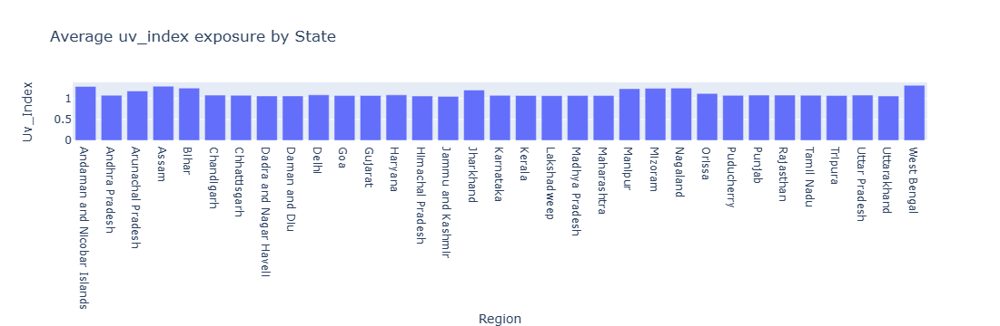

In [70]:
fig2=px.bar(df.groupby('Region')['Uv_Index'].mean().reset_index(), x='Region', y='Uv_Index', title='Average uv_index exposure by State')
fig2.show()

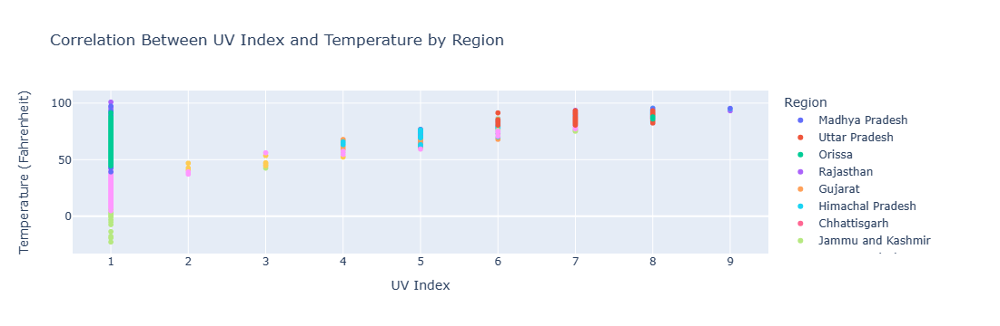

In [71]:
fig3 = px.scatter(df, x='Uv_Index', y='Temperature_Fahrenheit', color='Region',
                 title='Correlation Between UV Index and Temperature by Region',
                 labels={'Uv_Index': 'UV Index', 'Temperature_Fahrenheit': 'Temperature (Fahrenheit)'})

fig3.update_layout(xaxis_title='UV Index', yaxis_title='Temperature (Fahrenheit)')

fig3.show()

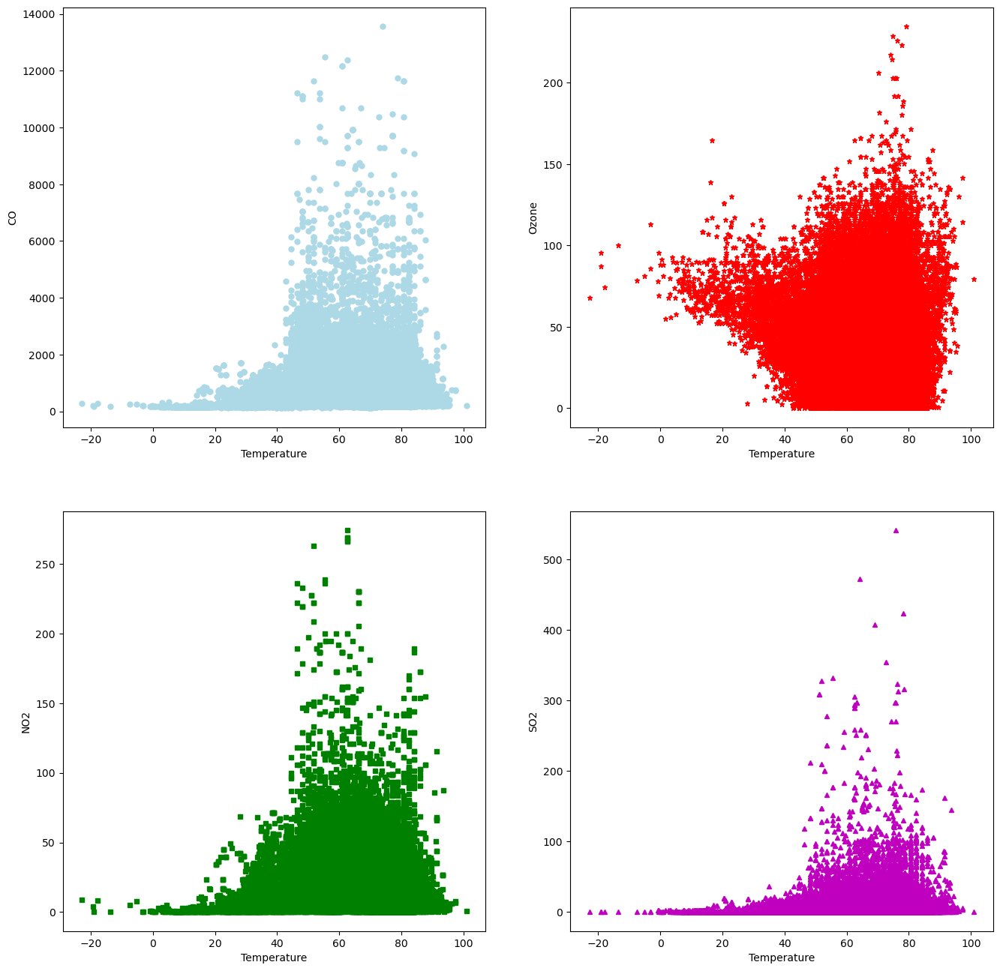

In [72]:
temp_weather=df
air_quality_metrics = ['Air_Quality_Carbon_Monoxide', 'Air_Quality_Ozone', 'Air_Quality_Nitrogen_Dioxide', 
                       'Air_Quality_Sulphur_Dioxide']

plt.figure(figsize=(16, 16))
plt.subplot(2, 2, 1)
plt.plot( "Temperature_Fahrenheit","Air_Quality_Carbon_Monoxide", data=temp_weather,color="lightblue",marker='o',ms="5",ls = '',label="CO")
plt.xlabel("Temperature")
plt.ylabel("CO")

plt.subplot(2, 2, 2)
plt.plot( "Temperature_Fahrenheit","Air_Quality_Ozone", data=temp_weather,color="r",marker='*',ms="5",ls = '',label="Ozone")
plt.xlabel("Temperature")
plt.ylabel("Ozone")

plt.subplot(2, 2, 3)
plt.plot( "Temperature_Fahrenheit","Air_Quality_Nitrogen_Dioxide", data=temp_weather,color="green",marker='s',ms="5",ls = '',label="NO2")
plt.xlabel("Temperature")
plt.ylabel("NO2")

plt.subplot(2, 2, 4)
plt.plot( "Temperature_Fahrenheit","Air_Quality_Sulphur_Dioxide", data=temp_weather,color="m",marker='^',ms="5",ls = '',label="SO2")
plt.xlabel("Temperature")
plt.ylabel("SO2")

plt.show()

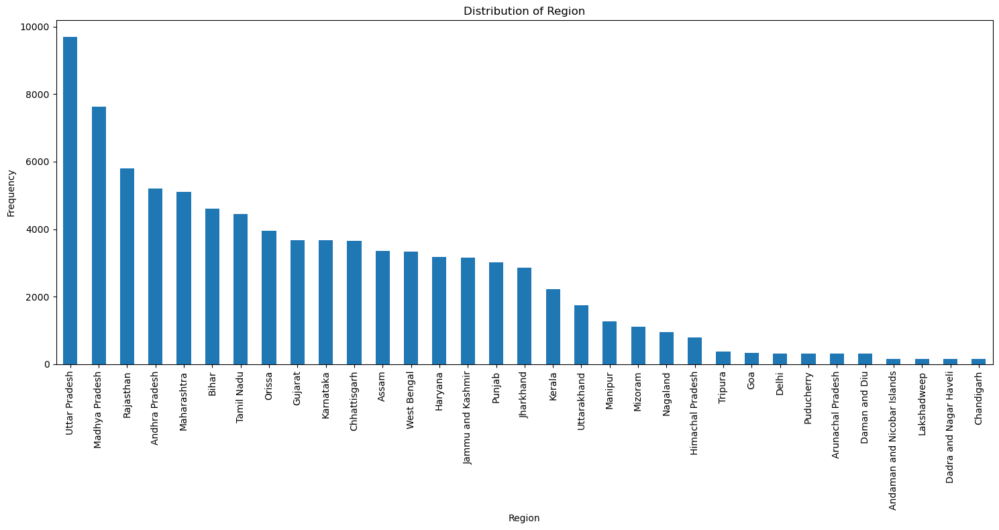

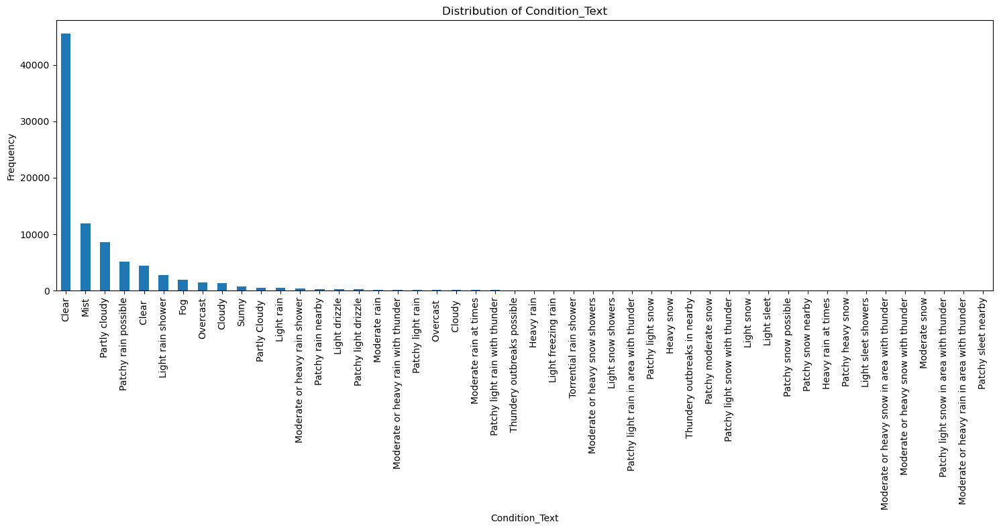

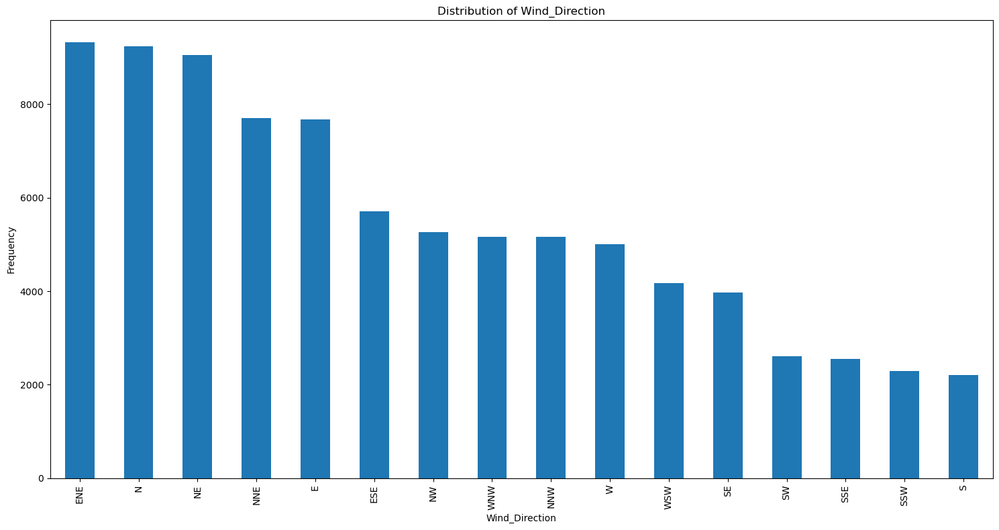

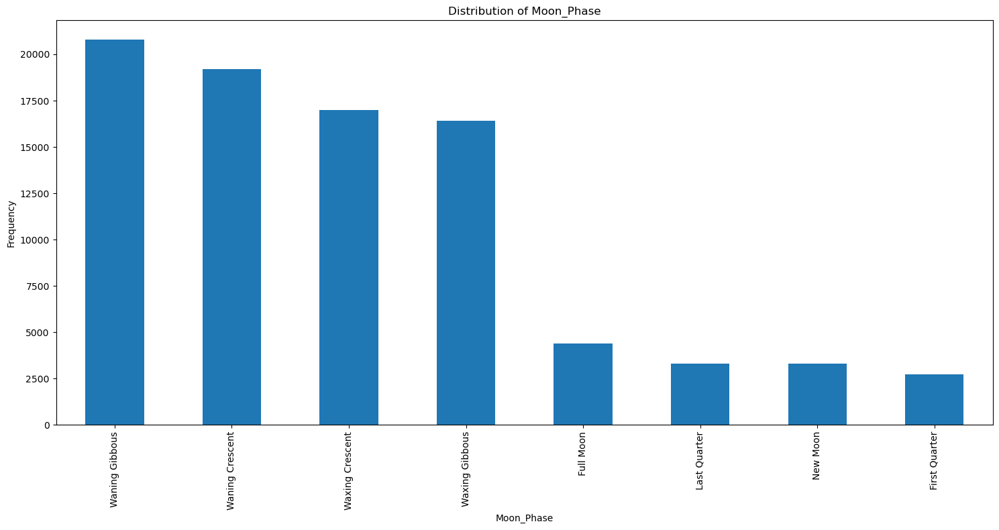

In [73]:
visualize = ['Region','Condition_Text','Wind_Direction', 'Moon_Phase'] 
for column in visualize:
    plt.figure(figsize=(15, 8))
    df[column].value_counts().plot(kind='bar')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.title(f'Distribution of {column}')
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

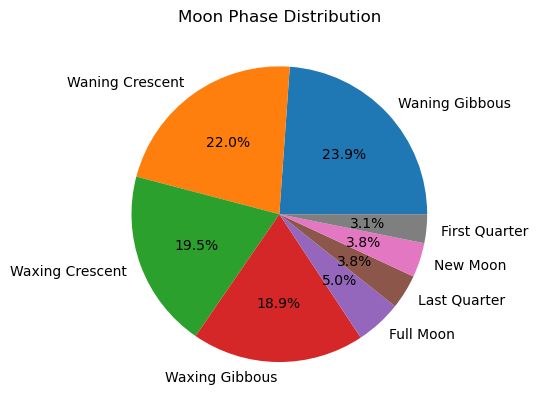

In [74]:
df['Moon_Phase'].value_counts().plot(kind='pie', autopct='%1.1f%%')
plt.title('Moon Phase Distribution')
plt.ylabel('')
plt.show()

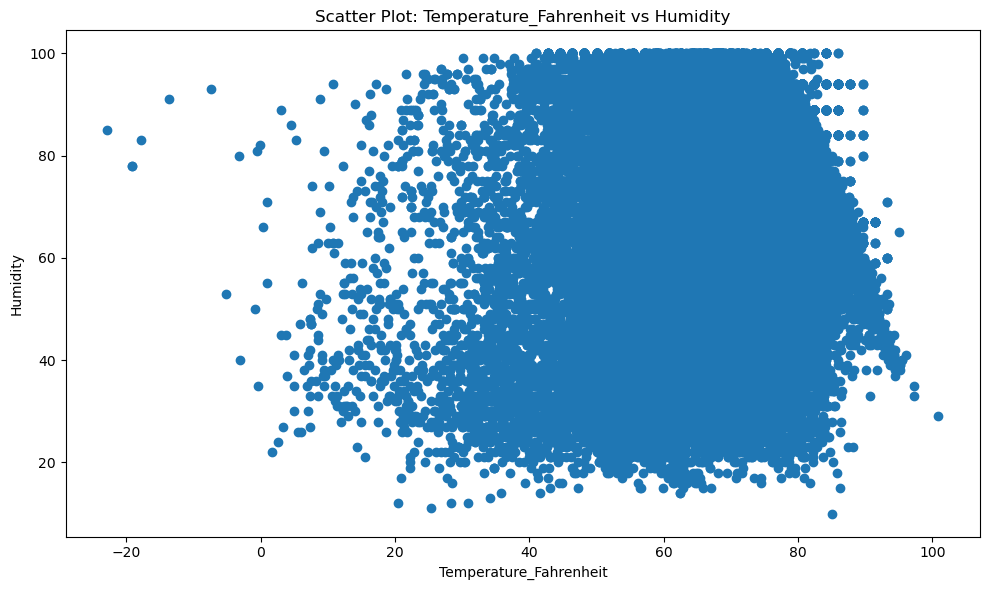

In [75]:
column_pairs = [('Temperature_Fahrenheit', 'Humidity')] 
for x_column, y_column in column_pairs:
    plt.figure(figsize=(10, 6))
    plt.scatter(df[x_column], df[y_column])
    plt.xlabel(x_column)
    plt.ylabel(y_column)
    plt.title(f'Scatter Plot: {x_column} vs {y_column}')
    plt.tight_layout()
    plt.show()

In [76]:
m = folium.Map(location=[df['Latitude'].mean(), df['Longitude'].mean()], zoom_start=5)
heat_data = [[row['Latitude'], row['Longitude'], row['Temperature_Fahrenheit']] for index, row in df.iterrows()]
HeatMap(heat_data, radius=15).add_to(m)
m.save('temperature_heatmap.html')
m

In [77]:
df.columns

Index(['Country', 'Location_Name', 'Region', 'Latitude', 'Longitude',
       'Timezone', 'Last_Updated', 'Temperature_Celsius',
       'Temperature_Fahrenheit', 'Condition_Text', 'Wind_mph', 'Wind_kph',
       'Wind_Degree', 'Wind_Direction', 'Humidity', 'Cloud',
       'Feels_Like_Celsius', 'Feels_Like_Fahrenheit', 'Visibility_km',
       'Visibility_Miles', 'Uv_Index', 'Air_Quality_Carbon_Monoxide',
       'Air_Quality_Ozone', 'Air_Quality_Nitrogen_Dioxide',
       'Air_Quality_Sulphur_Dioxide', 'Air_Quality_PM2.5', 'Air_Quality_PM10',
       'Air_Quality_Us-Epa-Index', 'Air_Quality_Gb-Defra-Index', 'Sunrise',
       'Sunset', 'Moonrise', 'Moonset', 'Moon_Phase', 'Moon_Illumination',
       'Date', 'Time'],
      dtype='object')

In [78]:
temperature_data = df['Temperature_Fahrenheit']
temperature_factors = df[['Latitude','Longitude','Wind_kph','Wind_Degree','Humidity','Cloud']]

In [79]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score

x_train, x_test, y_train, y_test = train_test_split(temperature_factors, temperature_data, test_size = 0.3, random_state = 0)

In [80]:
print("X_train:",x_train.shape)
print("X_test:",x_test.shape)
print("Y_train:",y_train.shape)
print("Y_test:",y_test.shape)

X_train: (60975, 6)
X_test: (26133, 6)
Y_train: (60975,)
Y_test: (26133,)


In [81]:
from sklearn.linear_model import LinearRegression

linreg=LinearRegression()
linreg.fit(x_train,y_train)

y_pred=linreg.predict(x_test)

model_accuracy=r2_score(y_test,y_pred)*300
print(" Accuracy of the model is %.2f" %model_accuracy)

 Accuracy of the model is 86.19


In [82]:
from sklearn.linear_model import Lasso

lasso = Lasso()
lasso.fit(x_train, y_train)

y_pred=lasso.predict(x_test)

model_accuracy=r2_score(y_test,y_pred)*300
print(" Accuracy of the model is %.2f" %model_accuracy)

 Accuracy of the model is 86.05


In [83]:
from sklearn.tree import DecisionTreeRegressor
regressor = DecisionTreeRegressor(random_state=0)
regressor.fit(x_train,y_train)

y_pred=regressor.predict(x_test)

model_accuracy=r2_score(y_test,y_pred)*100
print(" Accuracy of the model is %.2f" %model_accuracy)

 Accuracy of the model is 66.56


In [84]:
from sklearn.ensemble import RandomForestRegressor
regressor = RandomForestRegressor(n_estimators=100,random_state=0)

regressor.fit(x_train,y_train)
y_pred=regressor.predict(x_test)

model_accuracy=r2_score(y_test,y_pred)*100
print(" Accuracy of the model is %.2f" %model_accuracy)

 Accuracy of the model is 81.97
